Ce calepin décrit toutes les étapes m'ayant permis de réaliser un fond de carte personnalisé à partir d'un **assemblage de photographies satellite** de l'Espagne, customisé à partir d'un **extrait de vieux film de science-fiction**.

![Espagne, planète interdite](data\\espagne_16pi_r.jpg)

Nous ne le répèterons jamais assez : **savoir coder est un atout très enviable afin de personnaliser un maximum ses productions**, et j'espère que ce petit exercice de style en offrira une démonstration pertinente.

Pour commencer, et comme c'est du coutume en Python, nous importons les modules nécessaires :

In [2]:
import rasterio
import cv2 as cv
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageOps, ImageTk
from rasterio.enums import Resampling

## Réduction d'une palette via des K-moyennes

Nous allons entrer dans le vif du sujet en affichant un plan de film. [**La bibliothèque OpenCV**](https://opencv.org/) est toute désignée pour cela, et nous l'utiliserons dans la majeure partie de ce tutoriel. 

Elle a comme force principale **de traduire les images en tableaux Numpy, ce qui permet de les interroger et de les transformer en des temps record**.

La seule subtilité à ce stade revient, après avoir chargé l'image, à **la convertir en rouge-vert-bleu** (par défaut, OpenCV les lit en bleu-vert-rouge). Cela nous donne :

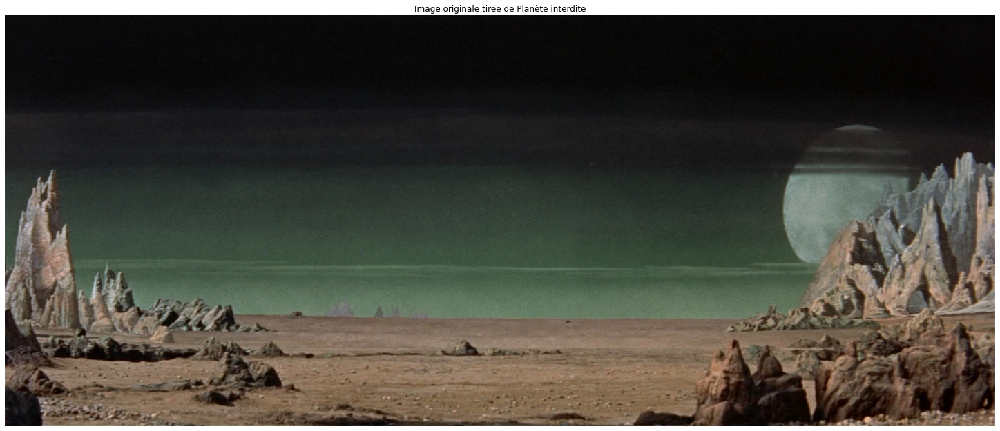

In [7]:
img = cv.imread("data\\forbidden_planet.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

fig, ax = plt.subplots(figsize=(20, 10),constrained_layout=True)

ax.set_title("Image originale tirée de Planète interdite")
ax.imshow(img)
ax.axis('off');

Un beau paysage de science-fiction des années 1950 sublimé par une pellicule Eastmancolor, nous sommes bien en présence d'un extrait de *Planète interdite*.

Une question qui va nous préoccuper afin de transférer la palette de ce plan à une photographie satellite, est **de réduire ladite palette**. Cette contrainte va nous conduire à chercher le meilleur compromis entre le nombre de couleurs et son rendu. Et **les K-moyennes** sont toutes désignées pour cela. 

Cet algorithme de partitionnement non supervisé (=> l'algorithme n'a aucune classification sur laquelle s'appuyer pour l'apprentissage) permet notamment de **regrouper des données par groupes similaires**, aussi appelés *clusters*.

Il peut être tout désigné dans les études de clientèles, mais également dans certains travaux sur les images. Nous pouvons l'utiliser par exemple pour **résumer des couleurs dans un espace à trois dimensions** (Rouge-Vert-Bleu) [afin d'extraire une palette](https://github.com/raphadasilva/devil_palette).

Beaucoup de librairies proposent leur propre implémantion des K-moyennes, et [OpenCV ne fait pas exception](https://docs.opencv.org/3.4/d1/d5c/tutorial_py_kmeans_opencv.html). Nous allons donc, suivant l'exemple fourni par OpenCV : 
* **reformater le tableau Numpy img** dans lequel les trois canaux sont distingués en un seul grand tableau
* **convertir tous les éléments de ces triplets en float32**. Ce formatage permet [de coder 16 777 216 valeurs distinctes](https://pythonspeed.com/articles/float64-float32-precision/) et pas une de plus. Ce qui est l'exacte variété de couleurs codées entre trois canaux, avec chaque canal pouvant avoir des valeur allant de 0 à 255 ($255^3$)
* enfin, nous paramétrons **un tuple de critères** à appliquer sur les K-moyennes

In [3]:
Z = img.reshape((-1,3))
Z = np.float32(Z)
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 10, 1.0)

Et c'est parti pour les illustrations, nous allons paramétrer une petite boucle de nombres paires for afin de mesurer **l'évolution de ces réductions de couleurs**. A chaque passage de boucle, nous allons juste changer le nombre de clusters et appliquer les K-moyennes sur l'image reformatée afin d'apprécier le résultat.

Comme elle est toujours considérée par la bibliothèque comme un tableau Numpy, ça ne va prendre beaucoup de temps :

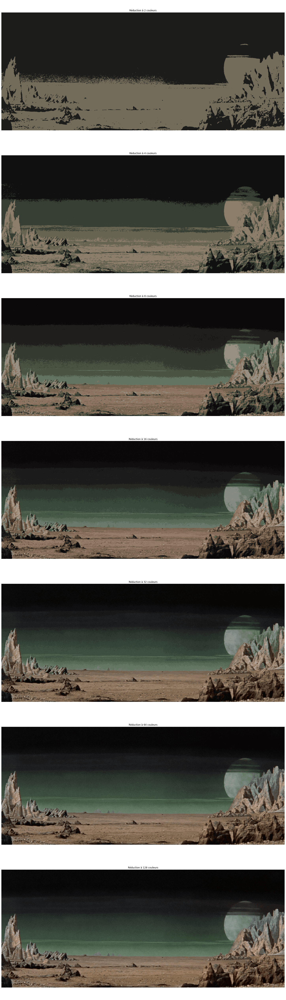

In [34]:
fig, ax = plt.subplots(figsize=(20, 70),constrained_layout=True)
gspec = fig.add_gridspec(nrows=7)

for i,j in zip([2,4,8,16,32,64,128],list(range(7))):
    current_axis = fig.add_subplot(gspec[j])
    current_axis.set_title(f"Réduction à {i} couleurs")
    K = i
    ret,label,center = cv.kmeans(Z,K,None,criteria,10,cv.KMEANS_PP_CENTERS)
    center = np.uint8(center)
    res = center[label.flatten()]
    res2 = res.reshape((img.shape))
    current_axis.imshow(res2)
    current_axis.axis('off')

ax.axis('off')
plt.show();

Les couleurs apparaissent vraiment à partir d'une palette de huit teintes, et nous pouvons observer une diminution de la pixellisation à partir de 32 couleurs. **Nous allons arbitrairement nous arrêter sur une palette de 16**, qui est au fond un assez bon compromis.

Donc, c'est parti pour relancer les K-moyennes avec 16 clusters :

In [4]:
K = 16
ret,label,center = cv.kmeans(Z,K,None,criteria,10,cv.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
res2 = res.reshape((img.shape))

Dernière chose : nous allons isoler les couleurs uniques de cette palette. Cela aura son importance ensuite :

In [90]:
unique_ref = np.unique(res2.reshape(-1, res2.shape[2]), axis=0)
unique_ref

array([[  9,   8,   8],
       [ 17,  15,  15],
       [ 28,  27,  28],
       [ 41,  42,  37],
       [ 48,  59,  50],
       [ 59,  76,  61],
       [ 73,  91,  73],
       [ 76,  58,  44],
       [ 89, 106,  88],
       [ 98,  81,  64],
       [105, 120, 103],
       [120, 100,  80],
       [129, 138, 130],
       [135, 113,  92],
       [149, 127, 106],
       [168, 152, 138]], dtype=uint8)

## Transformation de rasters en image simple

Il est temps de passer **au versant géographique de ce tutoriel**. Nous allons utiliser un assemblage [de photographies satellite capturées par Sentinel 2](https://www.esa.int/Applications/Observing_the_Earth/Copernicus/Sentinel-2), chouette fleuron de l'Agence spatiale  européenne.

Le Centre national d'information géographique espagnol fournit ces précieuses mosaïques [sur son portail de téléchargement](https://centrodedescargas.cnig.es/CentroDescargas/index.jsp#). Je reproduis les schémas pour obtenir la face nord et sud de l'Espagne métropolitaine, car les fichiers sont bien trop lourds pour être téléversés dans ce repo Github.

Si vous souhaitez faire ce tuto en conditions réelles, **vous devez d'abord télécharger chaque fichier tif** (prévoyez de la place, ces bébés pèsent respectivement 2,01 et 1,49 Go) et le copier dans le sous-dossier data voisin de ce calepin.

Depuis la page principale du portail, appliquez ce schéma :

Buscar < Búsqueda por listado < Fotos e imágenes aéreas < Mosaicos nacionales Sentinel 2 (División administrativa < Toda España)

Dans la liste de résultats affichés, il ne vous rester plus qu'à télécharger : 

* Península e Illes Balears Norte IRC. Invierno (2024) 
* Península e Illes Balears Sur IRC. Invierno (2024)

Une fois que ceci est fait, nous allons lire chaque fichier raster grâce [à la bibliothèque Rasterio](https://rasterio.readthedocs.io/en/stable/). Pour le dire vite, un raster est **une photographie agrémentée d'informations géographiques**, et nous allons isoler trois infos primordiales :
* les **dimensions du raster en pixel**
* sa **projection géographique**
* les **coordonnées géographiques des bordures de la photographie**

Ces **deux dernières caractéristiques seront indispensables pour la seconde partie de ce tutoriel**, afin de superposer des données vectorielles dans le même référentiel que notre fond de carte.

Concrètement, cela donne pour la face Nord :

In [12]:
norte = rasterio.open("data\\pnt_sentinel2_2024_invierno_mosaico_peninsula_illes-balears_b843_hu30_8bits_norte.tif")

print(f"Les dimensions du raster sont {norte.width}x{norte.height} pixels")
print(f"Sa projection est {norte.crs} ")
print(f"Ses contours dans cette projection {norte.bounds} ")

Les dimensions du raster sont 120583x50542 pixels
Sa projection est EPSG:25830 
Ses contours dans cette projection BoundingBox(left=-74125.16131267, bottom=4378085.01313695, right=1131704.83868733, top=4883505.01313695) 


Et pour la face Sud :

In [6]:
sur = rasterio.open("data\\pnt_sentinel2_2024_invierno_mosaico_peninsula_illes-balears_b843_hu30_8bits_sur.tif")

print(f"Les dimensions du raster sont {sur.width}x{sur.height} pixels")
print(f"Sa projection est {sur.crs} ")
print(f"Ses contours dans cette projection {sur.bounds} ")

Les dimensions du raster sont 120584x50744 pixels
Sa projection est EPSG:25830 
Ses contours dans cette projection BoundingBox(left=-74125.16131267, bottom=3870655.0131369503, right=1131714.83868733, top=4378095.01313695) 


En largeur, nous n'avons qu'un seul pixel de différence entre les deux rasters, tout à fait négligeable quand les images font plus de 120 000 pixels de large. L'ordre de grandeur pour la différence de hauteur est un poil plus élevé, mais on est dans des équivalences.

Côté projection, nous traitons avec [l'European Terrestrial Reference System 1989 ensemble](https://epsg.io/25830), qui aplanit l'Europe. Enfin, le cadre de l'image est le suivant :
* côté latitude, rien ne bouge entre les deux rasters (left=-74125.16131267 et right=1131714.83868733)
* côté longitude, il y a une différence prévisible, et pour être parfaitement d'équerre dans la seconde partir il faudra **retenir la partie supérieure de la face nord** (top=4883505.0131369) et l**a partie inférieure de la face sud** (bottom=3870655.0131369503)

En gardant en tête la projection et les bords de notre cadre, tout devrait se dérouler sans encombre par la suite. A ce stade, il faut tout de même se rendre à l'évidence qu'une image exédant les 100 000 pixels de large et de haut est bien trop définie pour une visualisation partageable sur les réseaux sociaux.

Nous allons donc réduire ces dimensions à 10% de leur taille initiale, [notamment en appliquant un rééchantillonage](https://mapscaping.com/converting-a-geotiff-to-png/). Il ne restera plus ensuite qu'à enregistrer chaque raster réduit en image PNG :

In [13]:
for r,n in zip([norte,sur],["norte_red","sur_red"]):
    data = r.read(out_shape=(r.count,int(r.height*.1),int(r.width*.1)),resampling=Resampling.bilinear)
    with rasterio.open("data\\"+n+".png", 'w', driver='PNG', height=data.shape[1], width=data.shape[2], count=r.count, dtype=data.dtype) as dst:
        dst.write(data)

C:\Users\Rapha\AppData\Local\Programs\Python\Python310\lib\site-packages\rasterio\__init__.py:238: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = writer(path, mode, driver=driver,


Ces deux images étant prêtes, nous allons pouvoir les ouvrir [avec la bibliothèque PIL](https://pillow.readthedocs.io/en/stable/), puis créer une nouvelle image aux bonnes dimensions, et coller chaque image aux bonnes coordonnées.

Très honnêtement, cela se fait sans aucune douleur :

In [15]:
norte_png = Image.open("data/norte_red.png")
sur_png = Image.open("data/sur_red.png")
esp_png = Image.new(mode="RGB", size=(norte_png.width,norte_png.height+sur_png.height), color=(0,0,0))
esp_png.paste(norte_png, (0,0))
esp_png.paste(sur_png, (0,norte_png.height))

Nous pouvons enfin visualiser cette orthophotographie de la péninsule ibérique sans risque de faire exploser son ordinateur :

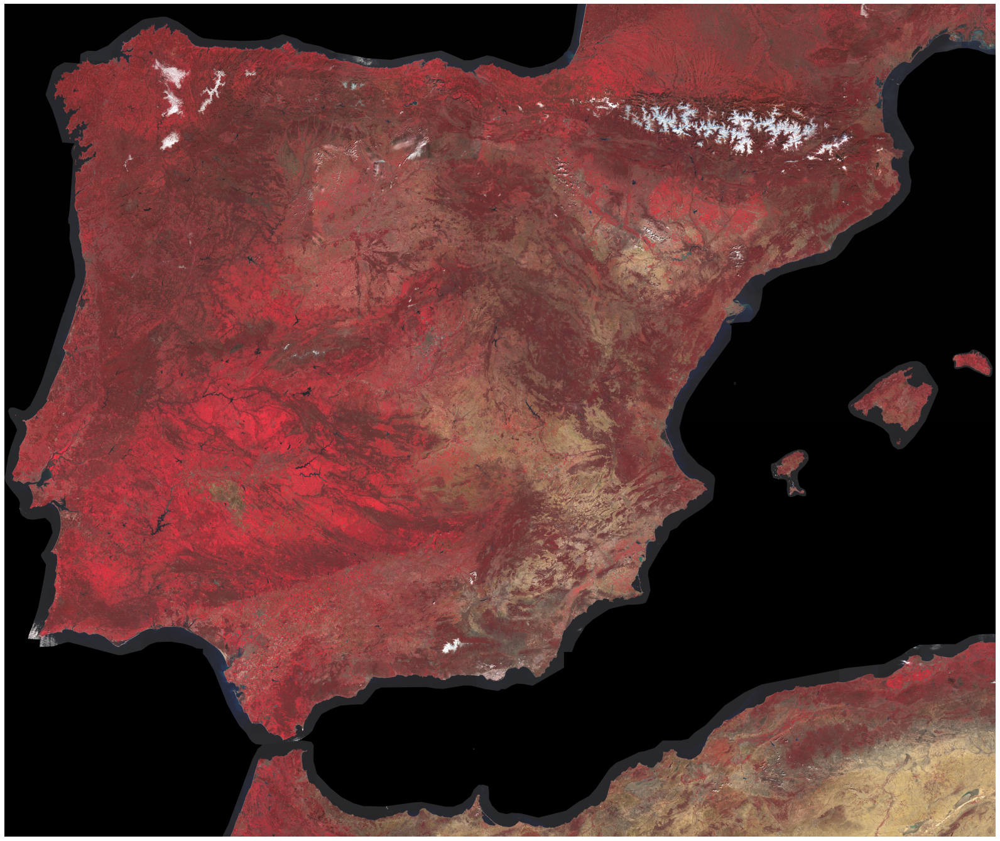

In [44]:
fig, ax = plt.subplots(figsize=(22, 20),constrained_layout=True)

ax.imshow(esp_png)
ax.axis('off');

Cette image infrarouge est en tout point conforme à ce qui était attendu, et nous allons la réserver avant la dernière étape du tutoriel :

In [55]:
esp_png.save("data\\espagne.png",subsampling=0, quality=100)

## Transfert de palettes

Et maintenant ? Maintenant, nous allons mettre sur les meilleurs rails possibles le transfert de la palette de *Planète interdite* vers le fond de carte.

La recette est simple, et **consiste juste à recycler ce qui a été fait avant** (soit un K-moyenne de 16 clusters) :

In [56]:
esp = cv.imread("data\\espagne.png")
esp = cv.cvtColor(esp, cv.COLOR_BGR2RGB)
Y = esp.reshape((-1,3))
Y = np.float32(Y)
ret,label,center = cv.kmeans(Y,K,None,criteria,10,cv.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
res_esp = res.reshape(esp.shape)

Nous pouvons l'afficher, afin d'apprécier la réduction de couleurs :

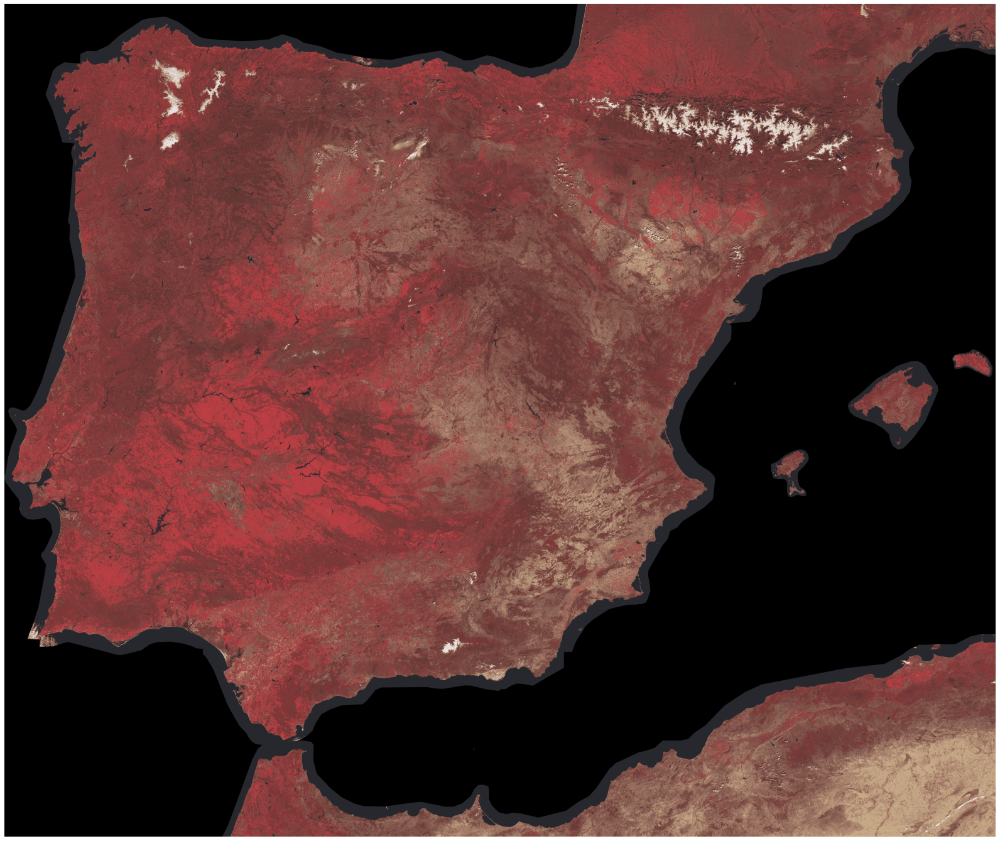

In [57]:
fig, ax = plt.subplots(figsize=(22, 20),constrained_layout=True)

ax.imshow(res_esp)
ax.axis('off');

Les rouges sont un peu plus ternes, mais la proposition se défend plutôt pas mal. Nous pouvons donc l'engistrer :

In [61]:
cv.imwrite("data\\espagne_16.png", cv.cvtColor(res_esp, cv.COLOR_RGB2BGR)) 

True

Battons le fer tant qu'il est chaud en affichant cette fois les couleurs uniques (triplets rouge, vert, bleu) du fond de carte :

In [3]:
# décommentez les lignes suivantes pour éventuellement relire l'image
#res_esp = cv.imread("data\\espagne_16.png")
#res_esp = cv.cvtColor(res_esp, cv.COLOR_BGR2RGB)
unique_target = np.unique(res_esp.reshape(-1, res_esp.shape[2]), axis=0)
unique_target

array([[  0,   0,   0],
       [ 39,  40,  45],
       [ 97,  54,  51],
       [114,  67,  63],
       [121,  63,  60],
       [122,  57,  56],
       [127,  82,  69],
       [129,  66,  64],
       [133,  52,  54],
       [133,  94,  84],
       [141,  65,  65],
       [150, 109,  93],
       [172, 134, 111],
       [186,  62,  67],
       [198, 169, 135],
       [233, 225, 224]], dtype=uint8)

Il est temps de se préoccuper du transfert de couleurs. Au moins trois solutions peuvent être envisagées. La première consisterait à **appliquer des fonctions de préférence**. Par exemple, nous pourrions calculer le pourcentage de chaque teinte au sein de l'image comme ceci :

In [6]:
round(len(res_esp[np.where((res_esp==[233, 225, 224]).all(axis=2))])/(res_esp.shape[0]*res_esp.shape[1])*100,2)

0.34

En rangeant les teintes par pourcentage décroissant, nous pourrions ensuite naviguer dans les couleurs de la plus à la moins prépondérante de l'image de référence (le fond de carte infrarouge) et comparer les distances de chacune de ses couleurs à ses homologues de l'autre image (le plan de *Planète interdite*) dans un espace RGB.

A chaque comparaison, **nous ferions la priorité à la couleur la plus proche de la référence pour le remplacement**. En vidant les listes au fur et à mesure nous garantirions l'absence de doublons. Je pense essayer de coder quelque chose d'approchant pour un projet photo.

Autre solution : **laisser intervenir le hasard**. Après tout il n'y a que **seize couleurs dans chaque image**, et nous pourrions très bien aussi les choses se faire au pif, en piochant une couleur donnée d'un côté, une couleur donnée de l'autre, et intervertir la première par la deuxième dans l'image de référence.

Ces tirages aléatoires pourraient amener des choses aussi surprenantes que pertinentes, et la seule contrainte serait de **continuer à vider les listes d'images au fur et à mesure** des remplacement afin d'éviter les doublons.

Autre solution : **celle du galérien**. Autrement dit, **choisir soi-même les couleurs à intervertir**. Dans notre cas, deux listes bien ordonnées suffisent. Une boucle for par-dessus pour remplacer chaque couleur de référence via une requête Numpy et le tour est joué :

In [136]:
ord_target = [[0,0,0],[39,40,45],[97,54,51],[114,67,63],[121,63,60],[122,57,56],[127,82,69],[129, 66, 64],[133,52,54],[133,94,84],[141,65,65],[150,109,93],[172,134,111],[186,62,67],[198,169,135],[233,225,224]]
ord_ref = [[105,120,103],[129,138,130],[98,81,64],[120,100,80],[135,113,92],[149,127,106],[17,15,15],[9,8,8],[89,106,88],[76,58,44],[168,152,138],[73,91,73],[59,76,61],[48,59,50],[41,42,37],[28,27,28]]

for t,r in zip(ord_target,ord_ref):
    res_esp[np.where((res_esp==t).all(axis=2))] = r

Plus qu'à vérifier que la manip' a bien marché :

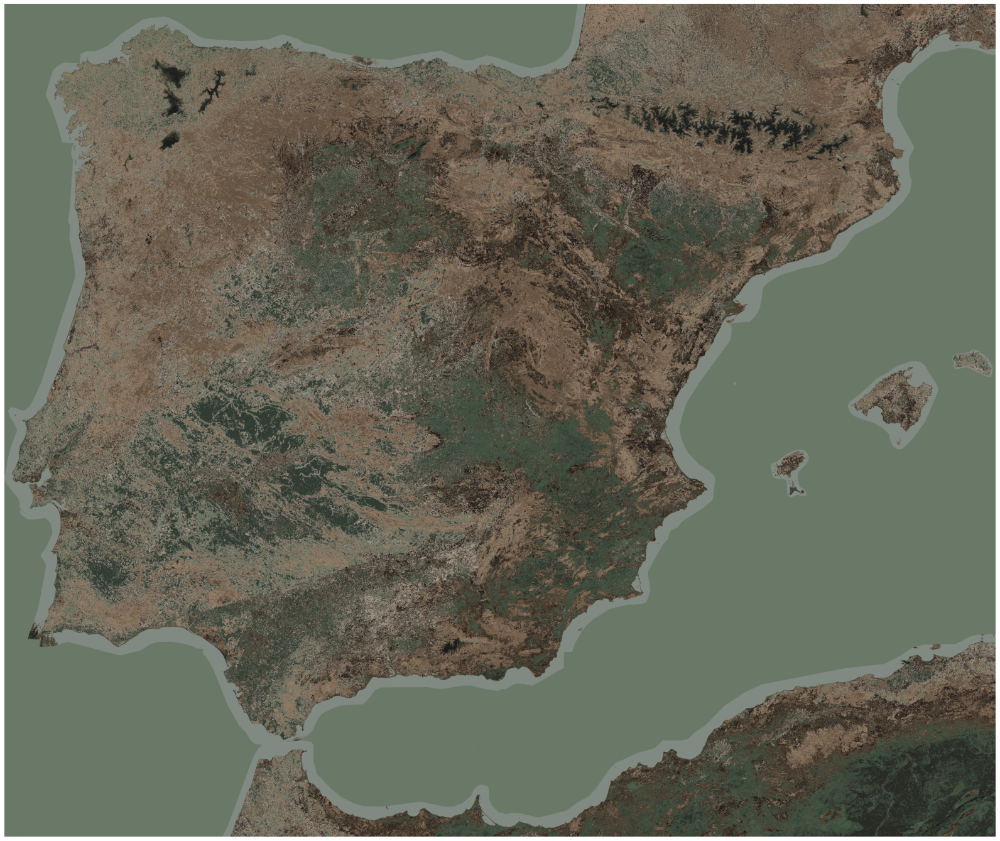

In [137]:
fig, ax = plt.subplots(figsize=(22, 20),constrained_layout=True)

ax.imshow(res_esp)
ax.axis('off');

C'est impeccable, nous n'avons plus qu'à enregistrer l'image avant de passer à la suite.

In [138]:
cv.imwrite("data\\espagne_16pi.png", cv.cvtColor(res_esp, cv.COLOR_RGB2BGR)) 

True